# Notes



## Robinhood Data
### Database

- each timestamp reflects the amount of users currently holding that particular stock

### Monthly Users

**Source:** https://www.statista.com/statistics/822176/number-of-users-robinhood/

- Comparing figures on Statista with data on Robinhood's website it emerges that the number of active users refers to Dec 31  
- Smoothing to avoid sudden jumps


## CRSP Data - Retrieved via WRDS
### Share Code (SHRCD)

**SHRCD** is a two-digit code describing the type of shares traded. The first digit describes the type of security traded.

**First Digit - Security Type**

| Code | Definition |
|------|--------------------------------------|
| 1    | Ordinary Common Shares               |
| 2    | Certificates                         |
| 3    | ADRs (American Depository Receipts)  |
| 4    | SBIs (Shares of Beneficial Interest) |
| 7    | Units (Depository Units, Units of Beneficial Interest, Units of Limited Partnership Interest, Depository Receipts, etc.) |

 **Note:** "Units" (code 7) does not represent combinations of common stock and anything else, such as warrants.

**Second Digit - Security Type (Detailed Information)**

| Code | Definition |
|------|------------------------------------------------|
| 0    | Securities which have not been further defined. |
| 1    | Securities which need not be further defined.  |
| 2    | Companies incorporated outside the US.        |
| 3    | Americus Trust Components (Primes and Scores). |
| 4    | Closed-end funds.                             |
| 5    | Closed-end fund companies incorporated outside the US. |
| 8    | REITs (Real Estate Investment Trusts).        |


# Section 1

##  Robinhood Dataframe

In [1]:
%load_ext autoreload
%autoreload 2

In [5]:

from src.DataLoader import DataLoader
import warnings
warnings.simplefilter(action='ignore', category=Warning)

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.ticker as ticker
import seaborn as sns


dl = DataLoader()

dl.df_rh

Loading Robinhood data
Loading CRSP data
Merging...


,A,AA,AAAU,AACG,AADR,AAL,AAMC,AAME,AAN,AAOI,...,ZTO,ZTR,ZTS,ZUMZ,ZUO,ZVO,ZYME,ZYNE,ZYXI,sum
timestamp,,,,,,,,,,,,,,,,,,,,,
2018-05-02,590.000000,NaN,NaN,55.000000,NaN,3755.000000,NaN,119.000000,110.000000,2711.000000,...,433.000000,233.000000,588.000000,248.000000,539.000000,NaN,NaN,6127.000000,NaN,5.597134e+06
2018-05-03,586.473684,NaN,NaN,55.473684,NaN,3778.368421,NaN,118.315789,109.000000,2714.105263,...,430.947368,232.842105,610.421053,250.052632,544.423077,NaN,NaN,6137.052632,NaN,5.611598e+06
2018-05-04,587.458333,NaN,NaN,55.458333,NaN,3762.750000,NaN,119.000000,107.916667,2711.458333,...,428.916667,231.625000,608.083333,249.166667,547.739130,NaN,NaN,6145.416667,NaN,5.610351e+06
2018-05-05,588.000000,NaN,NaN,56.000000,NaN,3748.000000,NaN,119.000000,109.000000,2719.000000,...,428.000000,230.000000,607.000000,247.000000,550.000000,NaN,NaN,6140.000000,NaN,5.574708e+06
2018-05-06,588.000000,NaN,NaN,56.000000,NaN,3748.000000,NaN,119.000000,109.000000,2719.000000,...,428.000000,230.000000,607.000000,247.000000,550.000000,NaN,NaN,6140.000000,NaN,5.574776e+06
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2020-08-09,1616.000000,5678.000000,1727.000000,1664.000000,13.0,641785.000000,89.000000,260.000000,1073.000000,1680.000000,...,2184.000000,843.000000,2735.000000,494.000000,6202.000000,5806.000000,674.000000,32097.000000,3192.000000,4.198372e+07
2020-08-10,1619.208333,5668.750000,1735.041667,1658.791667,13.0,640821.833333,88.375000,259.333333,1075.500000,1678.625000,...,2187.666667,842.916667,2736.208333,498.041667,6224.458333,5759.166667,673.208333,32060.833333,3186.916667,4.219150e+07
2020-08-11,1625.500000,5683.166667,1732.833333,1647.458333,13.0,639770.583333,87.250000,255.958333,1079.083333,1685.708333,...,2198.625000,845.708333,2732.416667,502.666667,6308.166667,5635.833333,674.875000,31939.875000,3170.041667,4.214662e+07


### Visualization

#### Distributuions

#### Number of Stocks

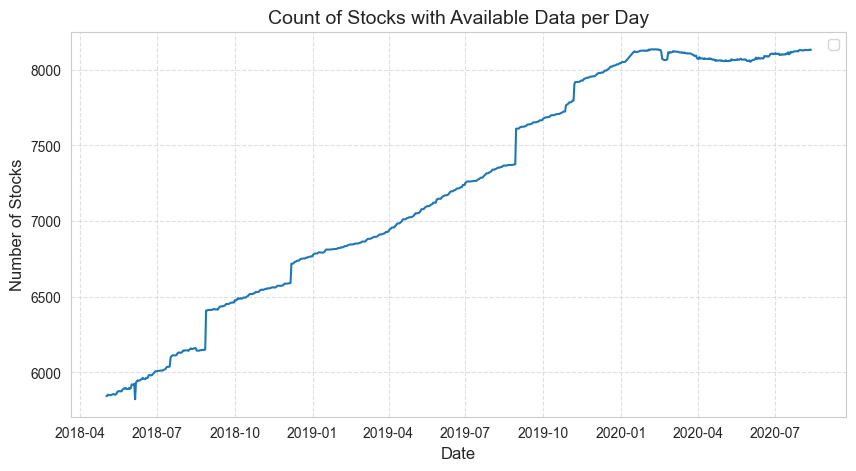

In [5]:
import seaborn as sns
import matplotlib.pyplot as plt
sns.set_style("whitegrid")

plt.figure(figsize=(10, 5))  # Set figure size
sns.lineplot(x=dl.df_rh.index, y='num_stocks', data=dl.df_rh)

# Formatting
plt.xlabel('Date', fontsize=12)
plt.ylabel('Number of Stocks', fontsize=12)
plt.title('Count of Stocks with Available Data per Day', fontsize=14)
plt.xticks(rotation=0)  # Rotate x-axis labels for better readability
plt.grid(True, linestyle='--', alpha=0.6)  # Add grid
plt.legend([], [], frameon=False) # Suppress legend
plt.legend()

# Show the plot
plt.show()

#### Number of Active Positions

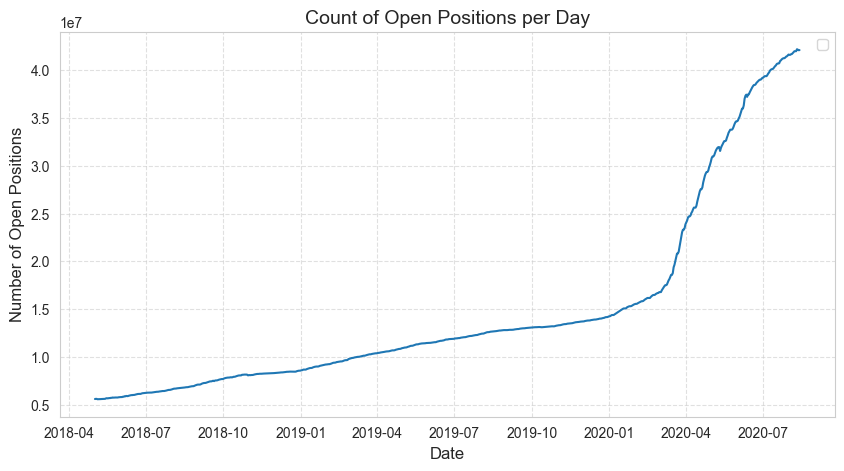

In [6]:
sns.set_style("whitegrid")

plt.figure(figsize=(10, 5))  # Set figure size
sns.lineplot(x=dl.df_rh.index, y='sum', data=dl.df_rh)

# Formatting
plt.xlabel('Date', fontsize=12)
plt.ylabel('Number of Open Positions', fontsize=12)
plt.title('Count of Open Positions per Day', fontsize=14)
plt.xticks(rotation=0)  # Rotate x-axis labels for better readability
plt.grid(True, linestyle='--', alpha=0.6)  # Add grid
plt.legend([], [], frameon=False) # Suppress legend
plt.legend()

# Show the plot
plt.show()

Loading Robinhood data
Loading CRSP data
Loading merged df
Merging...


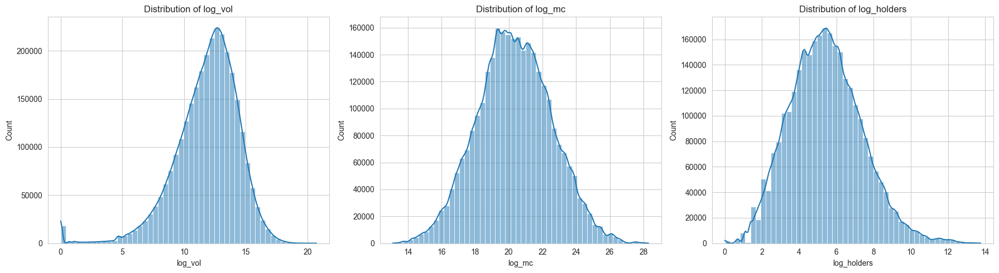

In [ ]:
dl = DataLoader(handle_nans="drop")
dl.merge_dfs()

import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np

# Define features to plot
features = ["vol", "mc", "holders"]
df_desc = df_merged[features+["ticker"]]
# Compute median per ticker
df = df_desc.groupby("ticker").median()

# Apply log transformation
for feature in features:
    df_desc[f"log_{feature}"] = np.log1p(df_desc[feature])

# Set Seaborn style
sns.set_style("whitegrid")

# Create a single row of 3 histograms
fig, axes = plt.subplots(1, 3, figsize=(18, 5))  # 1 row, 3 columns

for i, feature in enumerate(features):
    sns.histplot(df_desc[f"log_{feature}"], bins=50, kde=True, ax=axes[i])
    axes[i].set_title(f"Distribution of log_{feature}")

# Adjust layout
plt.tight_layout()
plt.show()


## Market Data

### Merged Dataframe with CRSP Data

In [ ]:
from src.DataLoader import DataLoader

dl = DataLoader(handle_nans="drop")

df_merged = dl.merge_dfs()

df_merged

Loading Robinhood data
Loading CRSP data
Merging...


,date,ticker,holders,shrcd,vol,prc_adj,shrout_adj,daily_returns,cumulative_returns,mc,mc_retail,daily_change_holders,daily_holders,popularity
0,2018-05-02,A,590.000000,11.0,2240482.0,65.91,322477000.0,NaN,NaN,2.125446e+10,38886.900000,NaN,5.239962e+06,0.000113
1,2018-05-03,A,586.473684,11.0,2365851.0,66.34,322477000.0,0.006503,0.006503,2.139312e+10,38906.664211,-3.526316,5.248722e+06,0.000112
2,2018-05-04,A,587.458333,11.0,1331017.0,67.00,322477000.0,0.009900,0.016402,2.160596e+10,39359.708333,0.984649,5.246256e+06,0.000112
3,2018-05-07,A,585.900000,11.0,1468735.0,67.39,322477000.0,0.005804,0.022206,2.173173e+10,39483.801000,-1.558333,5.236044e+06,0.000112
4,2018-05-08,A,577.125000,11.0,1916103.0,67.37,322477000.0,-0.000297,0.021910,2.172528e+10,38880.911250,-8.775000,5.242656e+06,0.000110
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2914450,2020-08-07,ZYNE,32151.291667,11.0,542213.0,4.22,29255000.0,-0.018780,-0.897151,1.234561e+08,135678.450833,-78.916667,3.259810e+07,0.000986
2914451,2020-08-10,ZYNE,32060.833333,11.0,584599.0,4.24,29255000.0,0.004728,-0.892423,1.240412e+08,135937.933333,-90.458333,3.266178e+07,0.000982
2914452,2020-08-11,ZYNE,31939.875000,11.0,449620.0,4.07,29255000.0,-0.040920,-0.933344,1.190679e+08,129995.291250,-120.958333,3.269811e+07,0.000977
2914453,2020-08-12,ZYNE,31851.578947,11.0,980844.0,3.96,29255000.0,-0.027399,-0.960742,1.158498e+08,126132.252632,-88.296053,3.268230e+07,0.000975


In [ ]:
df_merged["ticker"].unique()

array(['A', 'AACG', 'AAL', ..., 'ZUMZ', 'ZUO', 'ZYNE'], dtype=object)

In [10]:
dl.df_crsp["ticker"].unique()

array(['JJSF', 'PLXS', 'RMCF', ..., 'CBOE', 'SANW', 'TSLA'], dtype=object)

### Open Positions

In [ ]:
df_daily = df_merged[["date", "holders"]]
df_daily = df_daily.groupby("date").sum()
df_daily

,holders
date,
2018-05-02,5.239962e+06
2018-05-03,5.248722e+06
2018-05-04,5.246256e+06
2018-05-07,5.236044e+06
2018-05-08,5.242656e+06
...,...
2020-08-07,3.259810e+07
2020-08-10,3.266178e+07
2020-08-11,3.269811e+07


In [12]:
df_plot = dl.df_rh.loc[df_daily.index]


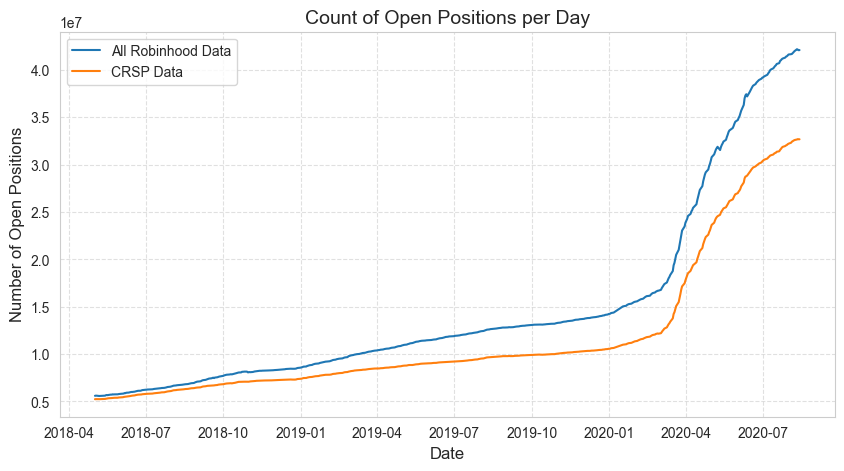

In [13]:
sns.set_style("whitegrid")

plt.figure(figsize=(10, 5))  # Set figure size
sns.lineplot(x=df_plot.index, y='sum', data=df_plot, label="All Robinhood Data")
sns.lineplot(x=df_plot.index, y='holders', data=df_daily, label="CRSP Data")

# Formatting
plt.xlabel('Date', fontsize=12)
plt.ylabel('Number of Open Positions', fontsize=12)
plt.title('Count of Open Positions per Day', fontsize=14)
plt.xticks(rotation=0)  # Rotate x-axis labels for better readability
plt.grid(True, linestyle='--', alpha=0.6)  # Add grid
plt.legend()

# Show the plot
plt.show()

#### Securities by Number

In [14]:
mapping = {
    11.0:"Stocks",
    12.0:"Stocks",
    73.0:"ETFs",
    31.0:"Funds",
    44.0:"Funds",
    48.0:"REITs"
}

In [ ]:
shrcd_counts =df_merged["shrcd"].value_counts().sort_index()
shrcd_counts = pd.DataFrame(shrcd_counts)
shrcd_counts["classification"] = shrcd_counts.index.map(mapping).fillna("Other")

shrcd_counts = shrcd_counts.groupby("classification").sum() 
shrcd_counts /= shrcd_counts.sum()

shrcd_counts

,count
classification,
ETFs,0.236835
Funds,0.086496
Other,0.091982
REITs,0.005612
Stocks,0.579075


#### Securities by Market Cap

In [ ]:
df_shrcd = df_merged[["shrcd", "mc", "mc_retail"]]
df_shrcd.loc[:,"classification"] = df_shrcd["shrcd"].map(mapping)
df_shrcd["classification"] = df_shrcd["classification"].fillna("Other")
df_shrcd = df_shrcd[["mc_retail","mc","classification"]]
df_shrcd = df_shrcd.groupby("classification").sum()
df_shrcd = df_shrcd / df_shrcd.sum(axis=0) 
df_shrcd = df_shrcd.reset_index()

df_shrcd

,classification,mc_retail,mc
0,ETFs,0.058236,0.096453
1,Funds,0.035664,0.031237
2,Other,0.013392,0.039540
3,REITs,0.000520,0.003368
4,Stocks,0.892188,0.829402


### Retail Participation vs Market Cap

In [ ]:
df_merged

,date,ticker,holders,shrcd,vol,prc_adj,shrout_adj,mc,mc_retail,daily_change_holders,daily_holders,popularity
0,2018-05-02,A,590.000000,11.0,2240482.0,65.91,322477000.0,2.125446e+10,38886.900000,NaN,5.239962e+06,0.000113
1,2018-05-03,A,586.473684,11.0,2365851.0,66.34,322477000.0,2.139312e+10,38906.664211,-3.526316,5.248722e+06,0.000112
2,2018-05-04,A,587.458333,11.0,1331017.0,67.00,322477000.0,2.160596e+10,39359.708333,0.984649,5.246256e+06,0.000112
3,2018-05-07,A,585.900000,11.0,1468735.0,67.39,322477000.0,2.173173e+10,39483.801000,-1.558333,5.236044e+06,0.000112
4,2018-05-08,A,577.125000,11.0,1916103.0,67.37,322477000.0,2.172528e+10,38880.911250,-8.775000,5.242656e+06,0.000110
...,...,...,...,...,...,...,...,...,...,...,...,...
2914450,2020-08-07,ZYNE,32151.291667,11.0,542213.0,4.22,29255000.0,1.234561e+08,135678.450833,-78.916667,3.259810e+07,0.000986
2914451,2020-08-10,ZYNE,32060.833333,11.0,584599.0,4.24,29255000.0,1.240412e+08,135937.933333,-90.458333,3.266178e+07,0.000982
2914452,2020-08-11,ZYNE,31939.875000,11.0,449620.0,4.07,29255000.0,1.190679e+08,129995.291250,-120.958333,3.269811e+07,0.000977
2914453,2020-08-12,ZYNE,31851.578947,11.0,980844.0,3.96,29255000.0,1.158498e+08,126132.252632,-88.296053,3.268230e+07,0.000975


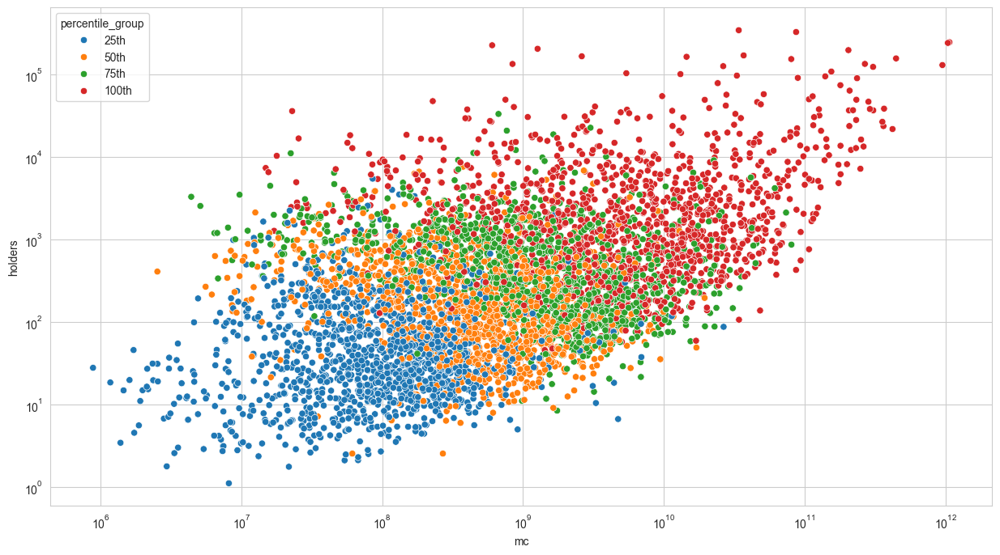

In [ ]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
sns.set_style("whitegrid")

df_scatter = df_merged[["mc", "holders", "ticker", "vol"]].groupby("ticker").mean()
percentile_bins = [0, 0.25, 0.50, 0.75, 1.0]  
percentile_labels = ["25th", "50th", "75th", "100th"]

df_scatter["percentile_group"] = pd.qcut(df_scatter["vol"], q=percentile_bins, labels=percentile_labels)


plt.figure(figsize=(15,8))

sns.scatterplot(data=df_scatter, x="mc", y="holders", hue="percentile_group")
plt.xscale("log")
plt.yscale("log")
plt.xticks(None)
plt.show()

## Comparing the Portfolios

### Distance Measures


In [ ]:
from src.DataLoader import DataLoader

dl = DataLoader(handle_nans="drop")
df_merged = dl.merge_dfs()

In [ ]:
df_top_n, df_rank = dl.compute_distances(n=50, df_merged=df_merged, by="popularity")


In [25]:
df_top_n

,date,ticker,mc,popularity,mc_retail,holders,prc_adj,shrcd,vol,rank_mkt,...,rank_popularity,rank_distance,m_daily,mc_retail_daily,popularity_daily,m_daily_pct,mc_retail_daily_pct,popularity_daily_pct,pct_distance,popularity_pct_distance
0,2018-05-02,AAPL,8.678660e+11,0.028776,2.662411e+07,150785.00,176.57001,11.0,66541423.0,1.0,...,1.0,-0.666667,3.275213e+13,5.006985e+08,3.275213e+13,0.026498,0.053174,8.785987e-16,1.418464e-03,-2.328111e-17
1,2018-05-02,GE,1.231322e+11,0.025713,1.910542e+06,134735.00,14.18000,11.0,51678009.0,40.0,...,2.0,0.481481,3.275213e+13,5.006985e+08,3.275213e+13,0.003760,0.003816,7.850780e-16,2.145829e-07,-2.951515e-18
2,2018-05-02,F,4.387708e+10,0.025014,1.469306e+06,131071.00,11.21000,11.0,41899467.0,144.0,...,3.0,2.789474,3.275213e+13,5.006985e+08,3.275213e+13,0.001340,0.002935,7.637285e-16,4.680080e-06,-1.023145e-18
3,2018-05-02,AMD,1.063370e+10,0.024468,1.406486e+06,128212.00,10.97000,11.0,29089898.0,559.0,...,4.0,12.634146,3.275213e+13,5.006985e+08,3.275213e+13,0.000325,0.002809,7.470696e-16,6.978725e-06,-2.425527e-19
4,2018-05-02,GPRO,5.574253e+08,0.021776,5.671068e+05,114106.00,4.97000,11.0,2494409.0,2813.0,...,5.0,32.891566,3.275213e+13,5.006985e+08,3.275213e+13,0.000017,0.001133,6.648763e-16,1.263577e-06,-1.131587e-20
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
28195,2020-08-13,VOO,1.597935e+11,0.004168,4.216136e+07,136219.70,309.51001,73.0,4074194.0,40.0,...,46.0,1.857143,4.091712e+13,4.689189e+09,4.091712e+13,0.003905,0.008991,1.018617e-16,4.572815e-05,-3.978003e-19
28196,2020-08-13,WKHS,1.599103e+09,0.004057,2.016695e+06,132590.10,15.21000,11.0,13459004.0,1833.0,...,47.0,10.825806,4.091712e+13,4.689189e+09,4.091712e+13,0.000039,0.000430,9.914759e-17,1.681552e-07,-3.874839e-21
28197,2020-08-13,GM,3.942672e+10,0.004021,3.620625e+06,131420.15,27.55000,11.0,7586072.0,186.0,...,48.0,1.066667,4.091712e+13,4.689189e+09,4.091712e+13,0.000964,0.000772,9.827273e-17,-1.478254e-07,-9.469318e-20
28198,2020-08-13,NOK,3.355301e+09,0.004008,6.627952e+05,130987.20,5.06000,31.0,21989476.0,1252.0,...,49.0,3.302405,4.091712e+13,4.689189e+09,4.091712e+13,0.000082,0.000141,9.794898e-17,8.387861e-09,-8.032050e-21


In [26]:
df_rank

,date,ticker,mc,popularity,mc_retail,holders,prc_adj,shrcd,vol,rank_mkt,...,rank_popularity,rank_distance,m_daily,mc_retail_daily,popularity_daily,m_daily_pct,mc_retail_daily_pct,popularity_daily_pct,pct_distance,popularity_pct_distance
4149,2018-05-02,AAPL,8.678660e+11,2.877597e-02,2.662411e+07,150785.0,176.57001,11.0,66541423.0,1.0,...,1.0,-0.666667,3.275213e+13,5.006985e+08,3.275213e+13,2.649800e-02,5.317393e-02,8.785987e-16,1.418464e-03,-2.328111e-17
1098468,2018-05-02,GE,1.231322e+11,2.571298e-02,1.910542e+06,134735.0,14.18000,11.0,51678009.0,40.0,...,2.0,0.481481,3.275213e+13,5.006985e+08,3.275213e+13,3.759518e-03,3.815754e-03,7.850780e-16,2.145829e-07,-2.951515e-18
899912,2018-05-02,F,4.387708e+10,2.501373e-02,1.469306e+06,131071.0,11.21000,11.0,41899467.0,144.0,...,3.0,2.789474,3.275213e+13,5.006985e+08,3.275213e+13,1.339671e-03,2.934512e-03,7.637285e-16,4.680080e-06,-1.023145e-18
106013,2018-05-02,AMD,1.063370e+10,2.446812e-02,1.406486e+06,128212.0,10.97000,11.0,29089898.0,559.0,...,4.0,12.634146,3.275213e+13,5.006985e+08,3.275213e+13,3.246722e-04,2.809047e-03,7.470696e-16,6.978725e-06,-2.425527e-19
1157438,2018-05-02,GPRO,5.574253e+08,2.177611e-02,5.671068e+05,114106.0,4.97000,11.0,2494409.0,2813.0,...,5.0,32.891566,3.275213e+13,5.006985e+08,3.275213e+13,1.701951e-05,1.132631e-03,6.648763e-16,1.263577e-06,-1.131587e-20
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
765018,2020-08-13,EFU,2.356688e+06,6.119361e-08,3.440420e+01,2.0,17.20210,73.0,157.0,5158.0,...,5171.5,-0.002514,4.091712e+13,4.689189e+09,4.091712e+13,5.759662e-08,7.336920e-09,1.495550e-21,-3.687514e-16,-8.613866e-29
2208695,2020-08-13,RFEU,2.067975e+07,6.119361e-08,1.181700e+02,2.0,59.08500,73.0,34.0,4885.0,...,5171.5,-0.051825,4.091712e+13,4.689189e+09,4.091712e+13,5.054058e-07,2.520052e-08,1.495550e-21,-1.210142e-14,-7.558600e-28
2671938,2020-08-13,UPV,4.402640e+06,6.119361e-08,8.805280e+01,2.0,44.02640,73.0,93.0,5134.0,...,5171.5,-0.006387,4.091712e+13,4.689189e+09,4.091712e+13,1.075990e-07,1.877783e-08,1.495550e-21,-1.667869e-15,-1.609197e-28
1099595,2020-08-13,GEC,6.765450e+07,0.000000e+00,0.000000e+00,0.0,2.65000,11.0,3383.0,4384.0,...,5174.5,-0.152441,4.091712e+13,4.689189e+09,4.091712e+13,1.653452e-06,0.000000e+00,0.000000e+00,-0.000000e+00,-0.000000e+00


In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

# Get unique tickers from df_top_n
tickers = df_top_n["ticker"].unique()

# Set plot style
sns.set_style("whitegrid")
plt.figure(figsize=(12, 6))  # Adjust figure size

df_covid =  df_rank[["ticker", "date", "popularity_pct_distance"]]
#df_covid =  df_covid[df_covid["date"]>"2020-02-01"]

# Loop through each ticker and plot its popularity over time
for ticker in tickers:
    data = df_covid[df_covid["ticker"] == ticker][["date", "popularity_pct_distance"]]
    
    # Sort by date to ensure proper plotting
    data = data.sort_values("date")

    # Plot the line
    sns.lineplot(x="date", y="popularity_pct_distance", data=data) #label=ticker

# Formatting
plt.xlabel('Date', fontsize=12)
plt.ylabel('Relative distance', fontsize=12)
plt.title('Popularity Percentage Distance for Selected Tickers', fontsize=14)
plt.xticks(rotation=45)  # Rotate x-axis labels for better readability
plt.grid(True, linestyle='--', alpha=0.6)  # Add grid
plt.legend


NameError: name 'df_top_n' is not defined

In [ ]:
df_rank

In [28]:
df_grouped = df_rank[["date", "rank_distance", "pct_distance", "popularity_pct_distance"]].groupby("date").sum()


In [29]:
df_grouped

,rank_distance,pct_distance,popularity_pct_distance
date,,,
2018-05-02,1811.819864,0.058406,-1.002184e-16
2018-05-03,1809.602600,0.058731,-9.972261e-17
2018-05-04,1803.698770,0.057802,-9.874125e-17
2018-05-07,1802.089824,0.057629,-9.846618e-17
2018-05-08,1799.504173,0.056502,-9.818601e-17
...,...,...,...
2020-08-07,1443.599260,0.108647,-8.759672e-17
2020-08-10,1449.270155,0.108079,-8.781374e-17
2020-08-11,1448.309724,0.107513,-8.811775e-17


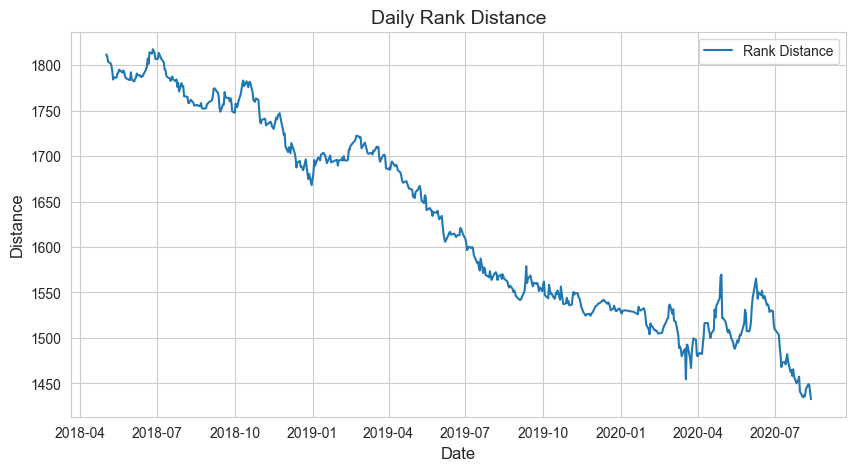

In [31]:
sns.set_style("whitegrid")

plt.figure(figsize=(10, 5))  # Set figure size
sns.lineplot(x=df_grouped.index, y='rank_distance', data=df_grouped, label="Rank Distance")
#sns.lineplot(x=df_grouped.index, y='pct_distance', data=df_grouped, label="Pct Data")

# Formatting
plt.xlabel('Date', fontsize=12)
plt.ylabel('Distance', fontsize=12)
plt.title('Daily Rank Distance', fontsize=14)
plt.xticks(rotation=0)  # Rotate x-axis labels for better readability
plt.legend()

# Show the plot
plt.show()

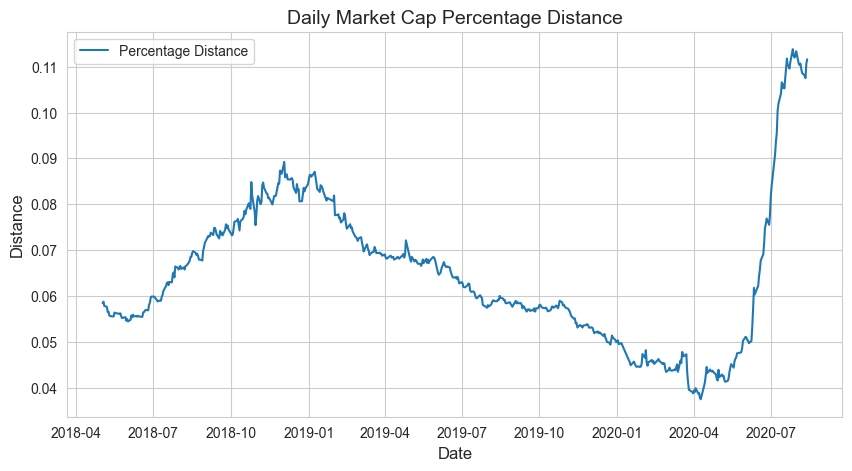

In [32]:
sns.set_style("whitegrid")

plt.figure(figsize=(10, 5))  # Set figure size
sns.lineplot(x=df_grouped.index, y='pct_distance', data=df_grouped, label="Percentage Distance")

# Formatting
plt.xlabel('Date', fontsize=12)
plt.ylabel('Distance', fontsize=12)
plt.title('Daily Market Cap Percentage Distance', fontsize=14)
plt.xticks(rotation=0)  # Rotate x-axis labels for better readability
plt.legend()

# Show the plot
plt.show()

In [33]:
df_top_n, df_rank = dl.compute_distances(n=100, by="holders")
df_top_n


,date,ticker,mc,popularity,mc_retail,holders,prc_adj,shrcd,vol,rank_mkt,...,rank_holders,rank_distance,m_daily,mc_retail_daily,holders_daily,m_daily_pct,mc_retail_daily_pct,holders_daily_pct,pct_distance,holders_pct_distance
0,2018-05-02,AAPL,8.678660e+11,0.028776,2.662411e+07,150785.00,176.57001,11.0,66541423.0,1.0,...,1.0,-0.666667,3.275213e+13,5.006985e+08,3.275213e+13,0.026498,0.053174,4.603823e-09,1.418464e-03,-1.219921e-10
1,2018-05-02,GE,1.231322e+11,0.025713,1.910542e+06,134735.00,14.18000,11.0,51678009.0,40.0,...,2.0,0.481481,3.275213e+13,5.006985e+08,3.275213e+13,0.003760,0.003816,4.113779e-09,2.145829e-07,-1.546581e-11
2,2018-05-02,F,4.387708e+10,0.025014,1.469306e+06,131071.00,11.21000,11.0,41899467.0,144.0,...,3.0,2.789474,3.275213e+13,5.006985e+08,3.275213e+13,0.001340,0.002935,4.001908e-09,4.680080e-06,-5.361225e-12
3,2018-05-02,AMD,1.063370e+10,0.024468,1.406486e+06,128212.00,10.97000,11.0,29089898.0,559.0,...,4.0,12.634146,3.275213e+13,5.006985e+08,3.275213e+13,0.000325,0.002809,3.914616e-09,6.978725e-06,-1.270952e-12
4,2018-05-02,GPRO,5.574253e+08,0.021776,5.671068e+05,114106.00,4.97000,11.0,2494409.0,2813.0,...,5.0,32.891566,3.275213e+13,5.006985e+08,3.275213e+13,0.000017,0.001133,3.483926e-09,1.263577e-06,-5.928259e-14
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
56395,2020-08-13,GLUU,1.329236e+09,0.001707,4.341376e+05,55801.75,7.78000,11.0,11110950.0,1995.0,...,96.0,4.063452,4.091712e+13,4.689189e+09,4.091712e+13,0.000032,0.000093,1.363775e-09,5.563904e-09,-4.430184e-14
56396,2020-08-13,ZOM,7.924917e+07,0.001703,7.822401e+03,55675.45,0.14050,12.0,51483543.0,4304.0,...,97.0,0.555475,4.091712e+13,4.689189e+09,4.091712e+13,0.000002,0.000002,1.360689e-09,-4.481460e-13,-2.633560e-15
56397,2020-08-13,ALK,4.672318e+09,0.001701,2.101058e+06,55598.25,37.79000,11.0,1802726.0,1016.0,...,98.0,5.864865,4.091712e+13,4.689189e+09,4.091712e+13,0.000114,0.000448,1.358802e-09,1.495972e-07,-1.551595e-13
56398,2020-08-13,COTY,3.136320e+09,0.001699,2.281654e+05,55514.70,4.11000,11.0,4151298.0,1297.0,...,99.0,1.243945,4.091712e+13,4.689189e+09,4.091712e+13,0.000077,0.000049,1.356760e-09,-1.362068e-09,-1.039946e-13


In [34]:
df_rank

,date,ticker,mc,popularity,mc_retail,holders,prc_adj,shrcd,vol,rank_mkt,...,rank_holders,rank_distance,m_daily,mc_retail_daily,holders_daily,m_daily_pct,mc_retail_daily_pct,holders_daily_pct,pct_distance,holders_pct_distance
4149,2018-05-02,AAPL,8.678660e+11,2.877597e-02,2.662411e+07,150785.0,176.57001,11.0,66541423.0,1.0,...,1.0,-0.666667,3.275213e+13,5.006985e+08,3.275213e+13,2.649800e-02,5.317393e-02,4.603823e-09,1.418464e-03,-1.219921e-10
1098468,2018-05-02,GE,1.231322e+11,2.571298e-02,1.910542e+06,134735.0,14.18000,11.0,51678009.0,40.0,...,2.0,0.481481,3.275213e+13,5.006985e+08,3.275213e+13,3.759518e-03,3.815754e-03,4.113779e-09,2.145829e-07,-1.546581e-11
899912,2018-05-02,F,4.387708e+10,2.501373e-02,1.469306e+06,131071.0,11.21000,11.0,41899467.0,144.0,...,3.0,2.789474,3.275213e+13,5.006985e+08,3.275213e+13,1.339671e-03,2.934512e-03,4.001908e-09,4.680080e-06,-5.361225e-12
106013,2018-05-02,AMD,1.063370e+10,2.446812e-02,1.406486e+06,128212.0,10.97000,11.0,29089898.0,559.0,...,4.0,12.634146,3.275213e+13,5.006985e+08,3.275213e+13,3.246722e-04,2.809047e-03,3.914616e-09,6.978725e-06,-1.270952e-12
1157438,2018-05-02,GPRO,5.574253e+08,2.177611e-02,5.671068e+05,114106.0,4.97000,11.0,2494409.0,2813.0,...,5.0,32.891566,3.275213e+13,5.006985e+08,3.275213e+13,1.701951e-05,1.132631e-03,3.483926e-09,1.263577e-06,-5.928259e-14
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
765018,2020-08-13,EFU,2.356688e+06,6.119361e-08,3.440420e+01,2.0,17.20210,73.0,157.0,5158.0,...,5171.5,-0.002514,4.091712e+13,4.689189e+09,4.091712e+13,5.759662e-08,7.336920e-09,4.887930e-14,-3.687514e-16,-2.815280e-21
2208695,2020-08-13,RFEU,2.067975e+07,6.119361e-08,1.181700e+02,2.0,59.08500,73.0,34.0,4885.0,...,5171.5,-0.051825,4.091712e+13,4.689189e+09,4.091712e+13,5.054058e-07,2.520052e-08,4.887930e-14,-1.210142e-14,-2.470388e-20
2671938,2020-08-13,UPV,4.402640e+06,6.119361e-08,8.805280e+01,2.0,44.02640,73.0,93.0,5134.0,...,5171.5,-0.006387,4.091712e+13,4.689189e+09,4.091712e+13,1.075990e-07,1.877783e-08,4.887930e-14,-1.667869e-15,-5.259360e-21
1099595,2020-08-13,GEC,6.765450e+07,0.000000e+00,0.000000e+00,0.0,2.65000,11.0,3383.0,4384.0,...,5174.5,-0.152441,4.091712e+13,4.689189e+09,4.091712e+13,1.653452e-06,0.000000e+00,0.000000e+00,-0.000000e+00,-0.000000e+00


## Trading Volume

In [ ]:
df_vol = df_merged[["date", "vol", "daily_change_holders", "daily_holders"]]
df_vol["abs_change"] = df_vol["daily_change_holders"]
df_vol = df_vol[["date", "daily_change_holders", "daily_holders", "vol", "abs_change"]].groupby("date").sum()
df_vol["relative_volatility"] = df_vol["abs_change"] / df_vol["daily_holders"]

In [ ]:
df_merged[df_merged["ticker"]=="AMZN"][["daily_change_holders", "vol"]]

,daily_change_holders,vol
121426,NaN,4360073.0
121427,318.210526,4251517.0
121428,-333.210526,3443067.0
121429,-535.300000,3801755.0
121430,-635.700000,3069149.0
...,...,...
121985,1748.000000,3925635.0
121986,3771.041667,3165604.0
121987,2865.583333,3705374.0
121988,1260.589912,3517918.0


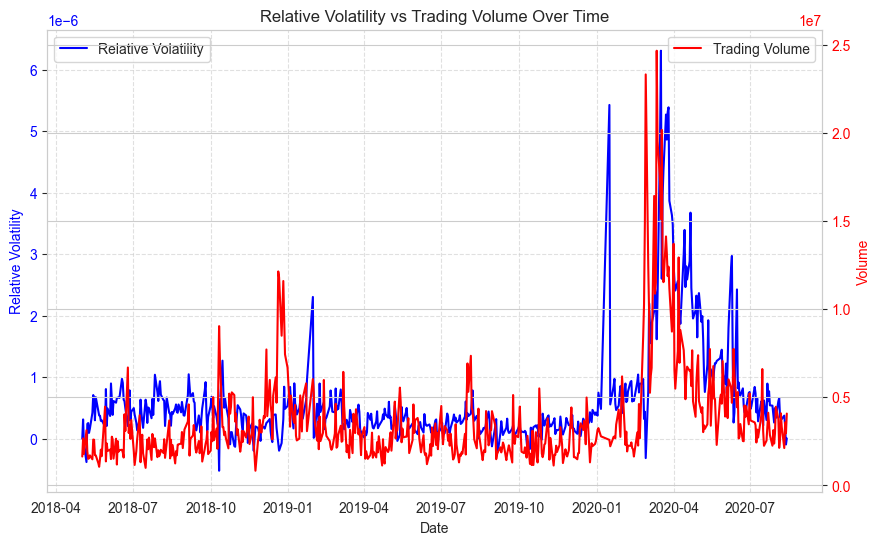

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt

# Create figure and axis
fig, ax1 = plt.subplots(figsize=(10, 6))

# First Y-axis (Left) - Relative Volatility using Seaborn
color1 = "blue"
sns.lineplot(x=df_vol.index, y=df_vol["relative_volatility"], ax=ax1, color=color1, label="Relative Volatility")
ax1.set_xlabel("Date")
ax1.set_ylabel("Relative Volatility", color=color1)
ax1.tick_params(axis="y", labelcolor=color1)

# Second Y-axis (Right) - Volume using Seaborn
df_plot = df_merged[df_merged["ticker"]=="VOO"]
df_plot = df_plot[["vol", "date"]]
ax2 = ax1.twinx()
color2 = "red"
sns.lineplot(x=df_plot["date"], y=df_plot["vol"], ax=ax2, color=color2, label="Trading Volume")
ax2.set_ylabel("Volume", color=color2)
ax2.tick_params(axis="y", labelcolor=color2)

# Title and Grid
plt.title("Relative Volatility vs Trading Volume Over Time")
ax1.grid(True, linestyle="--", alpha=0.6)

# Show plot
plt.show()


*I need to standardise by the amount of active holders*

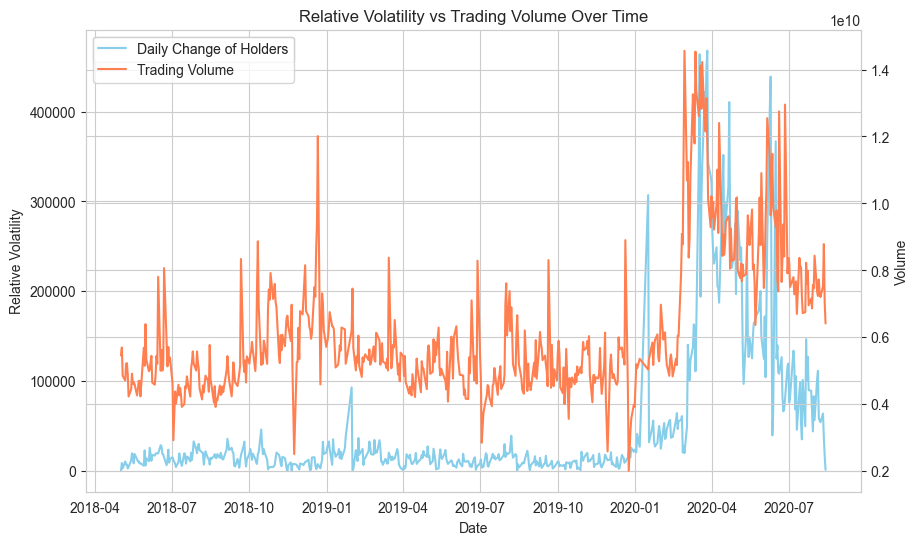

In [ ]:
df_amzn = df_merged[["daily_change_holders", "vol", "date"]].groupby("date").sum().dropna()

import seaborn as sns
import matplotlib.pyplot as plt
import matplotlib.dates as mdates


sns.set_style("whitegrid")

# Create figure and axis
fig, ax1 = plt.subplots(figsize=(10, 6))

# First Y-axis (Left) - Relative Volatility using Seaborn
sns.lineplot(x=df_amzn.index, y=df_amzn["daily_change_holders"].abs(), ax=ax1,  label="Daily Change of Holders", color="skyblue")
ax1.set_xlabel("Date")
ax1.set_ylabel("Relative Volatility")
ax1.tick_params(axis="y")

# Second Y-axis (Right) - Volume using Seaborn
ax2 = ax1.twinx()

sns.lineplot(x=df_amzn.index, y=df_amzn["vol"], ax=ax2, label="Trading Volume", color="coral")
ax2.set_ylabel("Volume")
ax2.tick_params(axis="y")


lines1, labels1 = ax1.get_legend_handles_labels()
lines2, labels2 = ax2.get_legend_handles_labels()
ax2.legend(lines1 + lines2, labels1 + labels2, loc="upper left")  # Adjust location as needed


# Title and Grid
plt.title("Relative Volatility vs Trading Volume Over Time")
plt.xticks(rotation=45)  # Rotate labels for better readability
plt.gca().xaxis.set_major_locator(mdates.AutoDateLocator())  # Automatically optimize tick locations


# Show plot
plt.show()


# Section 2

In [1]:
%load_ext autoreload
%autoreload 2

#### Main Problems
**Facts**
> In December 12, 2019, Robinhood introduced fractional share trading on its platform
- I don't know how many stocks each position holds, BUT i know that fractional investments are possible.
    - I can assume that the amount of money invested in each stock is normally distributed and i.i.d. for each stock
    - However, I will never know if someone has sold 99.9% of their position in a certain stock 
- The number of total active users incresed significantly after the early-2020 covid crash

In [5]:
from src import Analyzer

an = Analyzer(compare_tickers=["VOO"])


Loading Robinhood data
Loading CRSP data
Merging...


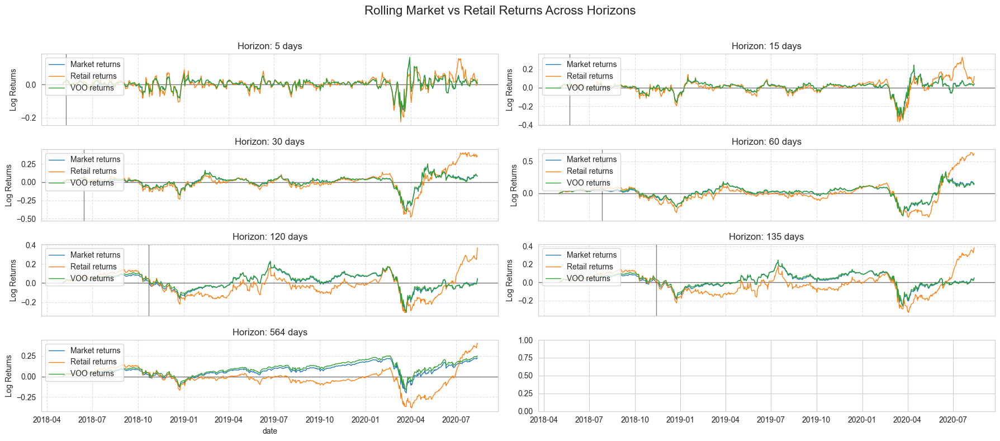

In [6]:
an.plot_returns_timeseries()

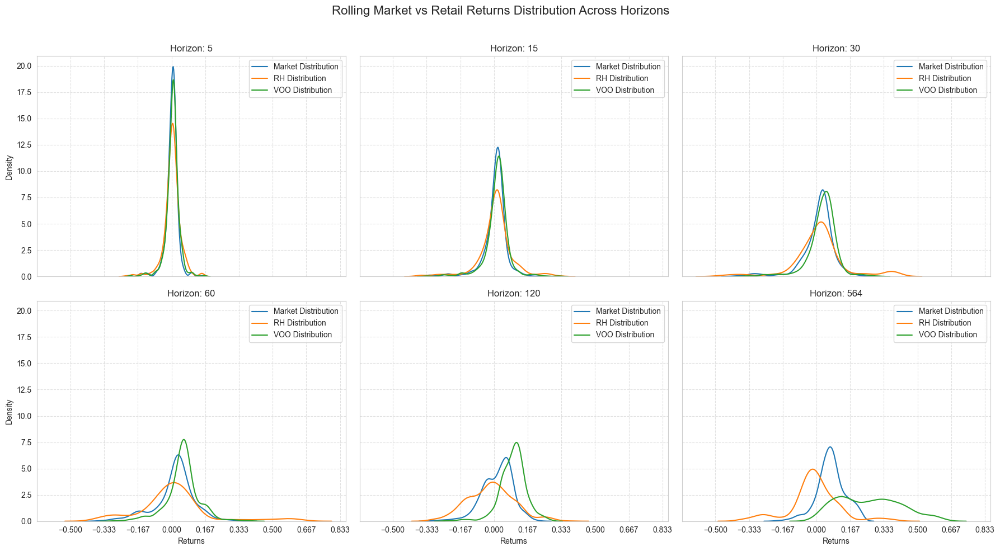

In [53]:
an.plot_returns_kdes()

In [60]:
an.build_returns()[0].describe().T

,count,mean,std,min,25%,50%,75%,max
rh_portfolio,135.0,0.002637,0.029983,-0.132418,-0.007526,0.007992,0.018624,0.072834
mc,135.0,0.000315,0.027589,-0.125530,-0.008872,0.003370,0.012872,0.086638
voo,135.0,0.001335,0.029370,-0.124870,-0.007167,0.003183,0.012399,0.091087
mc_5_return,135.0,0.001404,0.053633,-0.207961,-0.011126,0.012611,0.027743,0.151462
rh_portfolio_5_return,135.0,0.011985,0.070251,-0.224582,-0.009588,0.022255,0.056277,0.153719
voo_5_return,135.0,0.006521,0.055281,-0.204425,-0.010462,0.015773,0.030792,0.162820
mc_15_return,135.0,0.002399,0.104359,-0.330655,-0.005904,0.029298,0.048319,0.232431
rh_portfolio_15_return,135.0,0.032488,0.154013,-0.370881,-0.023944,0.054553,0.121402,0.329318
voo_15_return,135.0,0.017890,0.101759,-0.329074,-0.009829,0.027545,0.064151,0.316891
mc_30_return,135.0,0.001100,0.143512,-0.402208,-0.068384,0.049099,0.091231,0.246161


### Analyzing from the 2020-02-03 Pandemic 

Merging...


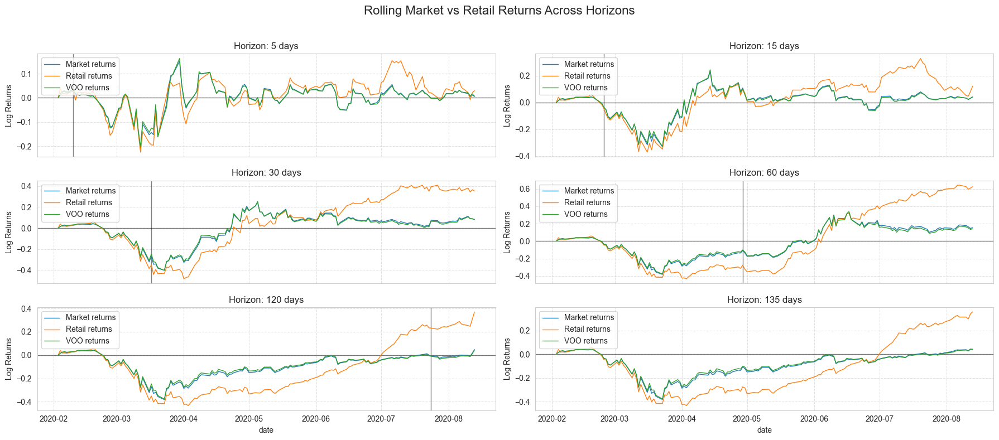

In [3]:
an.plot_returns_timeseries(returns_kwargs={"start_date":"2020-02-03"})

Merging...


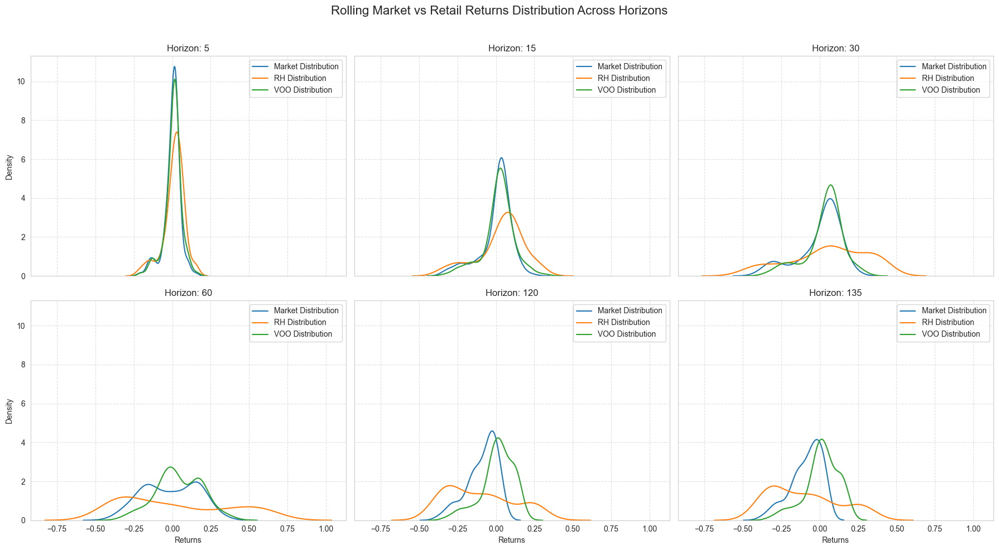

In [56]:
an.plot_returns_kdes(returns_kwargs={"start_date":"2020-02-03"})

In [61]:
an.build_returns()[0].describe().T

,count,mean,std,min,25%,50%,75%,max
rh_portfolio,135.0,0.002637,0.029983,-0.132418,-0.007526,0.007992,0.018624,0.072834
mc,135.0,0.000315,0.027589,-0.125530,-0.008872,0.003370,0.012872,0.086638
voo,135.0,0.001335,0.029370,-0.124870,-0.007167,0.003183,0.012399,0.091087
mc_5_return,135.0,0.001404,0.053633,-0.207961,-0.011126,0.012611,0.027743,0.151462
rh_portfolio_5_return,135.0,0.011985,0.070251,-0.224582,-0.009588,0.022255,0.056277,0.153719
voo_5_return,135.0,0.006521,0.055281,-0.204425,-0.010462,0.015773,0.030792,0.162820
mc_15_return,135.0,0.002399,0.104359,-0.330655,-0.005904,0.029298,0.048319,0.232431
rh_portfolio_15_return,135.0,0.032488,0.154013,-0.370881,-0.023944,0.054553,0.121402,0.329318
voo_15_return,135.0,0.017890,0.101759,-0.329074,-0.009829,0.027545,0.064151,0.316891
mc_30_return,135.0,0.001100,0.143512,-0.402208,-0.068384,0.049099,0.091231,0.246161
